# Exploring Public Sentiment on Twitter: An NLP Approach

## Part 1: Setting Up

In [104]:
# Importing InteractiveShell from IPython.core.interactiveshell module
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
import matplotlib

###  Import the Libraries

In [95]:
import os
import re
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
import plotly_express as px
from gensim.corpora import Dictionary
from gensim.models.ldamulticore import LdaMulticore
from gensim.models.coherencemodel import CoherenceModel
import pyLDAvis.gensim
from wordcloud import WordCloud
import nbconvert

## Part 2: Data Collection and Preprocessing

###  Load the Dataset and Have a First Look

##### Load the CSV into a variable named `df_twitter`

In [50]:
df_twitter = pd.read_csv('covid19_twitter_dataset.csv', index_col=0)
df_twitter.head()


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,language,lat,long,country
0,Tom Basile 🇺🇸,"new york, ny","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,en,40.712728,-74.006015,United States
1,Time4fisticuffs,"pewee valley, ky",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,en,38.310625,-85.487459,United States
2,DIPR-J&K,jammu and kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,en,33.664930,75.162958,India
3,🎹 Franz Schubert,новоро́ссия,🎼 #Новоро́ссия #Novorossiya #оставайсядома #S...,2018-03-19 16:29:52,1180,1071,1287,False,2020-07-25 12:27:06,#coronavirus #covid19 deaths continue to rise....,"['coronavirus', 'covid19']",Twitter Web App,False,en,43.341088,132.625674,Россия
5,Creativegms,"dhaka,bangladesh","I'm Motalib Mia, Logo -Logo Designer - Brandin...",2020-01-12 09:03:01,241,1694,8443,False,2020-07-25 12:26:50,Order here: https://t.co/4NUrGX6EmA\n\n#logo #...,"['logo', 'graphicdesigner', 'logodesign', 'log...",Twitter Web App,False,en,23.764402,90.389015,বাংলাদেশ


##### Display the DataFrame along with the row count

In [51]:
df_twitter.shape


(111973, 17)

##### Show the tweet count for the top 10 countries

In [52]:
df_twitter['country'].value_counts()[:10]


country
United States     41931
India             19473
United Kingdom    11544
Canada             6679
Australia          4370
Nigeria            2632
South Africa       2415
Éire / Ireland     1545
Kenya              1493
中国                 1141
Name: count, dtype: int64

##### Plot the top 20 users who post the most

<Axes: ylabel='user_name'>

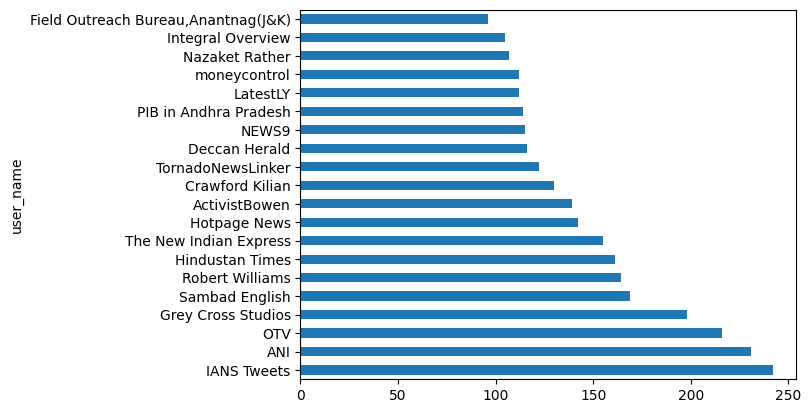

In [53]:
df_twitter['user_name'].value_counts()[:20].plot(kind='barh')



###  Basic Text Preprocessing

##### Remove unnecessary columns for the analysis

In [54]:
df_twitter.drop(['user_description','user_created','user_favourites','language'], axis=1, inplace=True)


##### Check for missing values and handle them

In [107]:
df_twitter.isnull().sum() # to check for missing values

# Fill missing values in 'hashtags' with an empty list
# df_twitter['hashtags'].fillna("[]", inplace=True)
df_twitter['hashtags'] = df_twitter['hashtags'].fillna("[]")


user_name           0
user_location       0
user_followers      0
user_friends        0
user_verified       0
date                0
text                0
hashtags            0
source              0
is_retweet          0
lat                 0
long                0
country             0
year                0
month               0
day                 0
hour                0
day_of_week         0
sentiment_scores    0
sentiment           0
sentiment_value     0
text_tokens         0
topic               0
dtype: int64

##### Convert `date` column to datetime object and extract features

In [56]:
df_twitter['date'] = pd.to_datetime(df_twitter['date'])
df_twitter['year'] = df_twitter['date'].dt.year
df_twitter['month'] = df_twitter['date'].dt.month
df_twitter['day'] = df_twitter['date'].dt.day
df_twitter['hour'] = df_twitter['date'].dt.hour
df_twitter['day_of_week'] = df_twitter['date'].dt.dayofweek

##### Apply `basic_clean_text()` function to `text` column

In [57]:
def basic_clean_text(text):
    # Convert to lowercase
    text = text.lower()

    # Remove extra whitespace
    text = re.sub(r" +", ' ', text, flags=re.MULTILINE)

    # Remove URLs
    text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)

    # remove HTML tags
    text = text.replace('<.*?>', '')

    # remove non-alphanumeric characters
    text = text.replace('[^A-Za-z0-9 ]+', '')

    # Remove punctuation
    text = re.sub(r'[^\w\s]', '', text)

    # Remove numbers
    text = re.sub(r'\d+', '', text)

    return text

df_twitter['text'] = df_twitter['text'].apply(basic_clean_text)

###  Implement Advanced Text Preprocessing

##### Apply `advanced_text_preprocessing()` function to `text` column

In [96]:
def advanced_text_preprocessing(text):
    # Tokenization
    tokens = word_tokenize(text)

    # Stopword Removal
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word.lower() not in stop_words]

    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(word) for word in filtered_tokens]

    # Join tokens back to form the preprocessed text
    preprocessed_text = " ".join(lemmatized_tokens)

    return preprocessed_text

df_twitter['text'] = df_twitter['text'].apply(advanced_text_preprocessing)



## Part 3: Sentiment Analysis

In [64]:
# Initialize VADER
sid = SentimentIntensityAnalyzer()

# Get sentiment scores for each tweet
df_twitter['sentiment_scores'] = df_twitter['text'].apply(lambda x: sid.polarity_scores(x))

###  Perform Sentiment Analysis with Vader Library

##### Perform sentiment analysis with vader library

In [97]:
# Get sentiment scores for each tweet
df_twitter['sentiment_scores'] = df_twitter['text'].apply(lambda x: sid.polarity_scores(x))



##### Display a random sample of 10 tweets with their sentiment scores

In [67]:
df_twitter[['text','sentiment_scores']].sample(10).values

array([['opinion need start thinking long term solution challenge restriction brought',
        {'neg': 0.165, 'neu': 0.551, 'pos': 0.283, 'compound': 0.128}],
       ['u covid update total case new case death',
        {'neg': 0.394, 'neu': 0.606, 'pos': 0.0, 'compound': -0.5994}],
       ['publicationoftheday following announcement kamalaharris joebidens running mate thought wed tak',
        {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}],
       ['cover face letting personality show mask redbubble mask covid ppe pandemic',
        {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}],
       ['new face covering nonmedical face mask mandatory walmart canada store starting wednesday',
        {'neg': 0.0, 'neu': 0.894, 'pos': 0.106, 'compound': 0.0772}],
       ['assam covid case reported last hour active case stand',
        {'neg': 0.0, 'neu': 0.748, 'pos': 0.252, 'compound': 0.4019}],
       ['new covid daily case record u rd straight day death first time since',
        {

###  Classify the Tweets into Positive, Neutral and Negative

##### Classify the tweets into categories of positive, negative, or neutral sentiment

In [68]:
threshold_value = 0.0

# Get sentiment based on the compound score
df_twitter['sentiment'] = df_twitter['sentiment_scores'].apply(lambda x: 'positive' if x['compound'] > threshold_value else ('neutral' if x['compound'] == threshold_value else 'negative'))

# Print the sentiment distribution
print(df_twitter['sentiment'].value_counts())

sentiment
positive    45240
negative    33772
neutral     32961
Name: count, dtype: int64


## Part 4: Trend Analysis and Visualization

###  Display the Evolution of Sentiment Over Time

##### Extract the top 3 countries to be used as a filter

In [69]:
# Identifying the 3 most active countries based on the number of tweets
most_active_countries = df_twitter['country'].value_counts().nlargest(3).index.tolist()
most_active_countries

['United States', 'India', 'United Kingdom']

##### Filter the DataFrame

In [70]:
# Filtering the data to include only the 3 most active countries
filtered_data = df_twitter[df_twitter['country'].isin(most_active_countries)]
filtered_data.shape

(72948, 20)

##### Create sentiment over time by country based on `groupby`

In [71]:
sentiment_over_time_by_country = filtered_data.groupby([pd.Grouper(key='date', freq='D'), 'country'])['sentiment'].value_counts().unstack().fillna(0).reset_index()

# Melt the DataFrame to have a 'sentiment' column and a 'count' column
sentiment_melted = sentiment_over_time_by_country.melt(id_vars=['date', 'country'], value_vars=['negative', 'neutral', 'positive'], var_name='sentiment', value_name='count')

##### Plot the top three countries sentiments over time

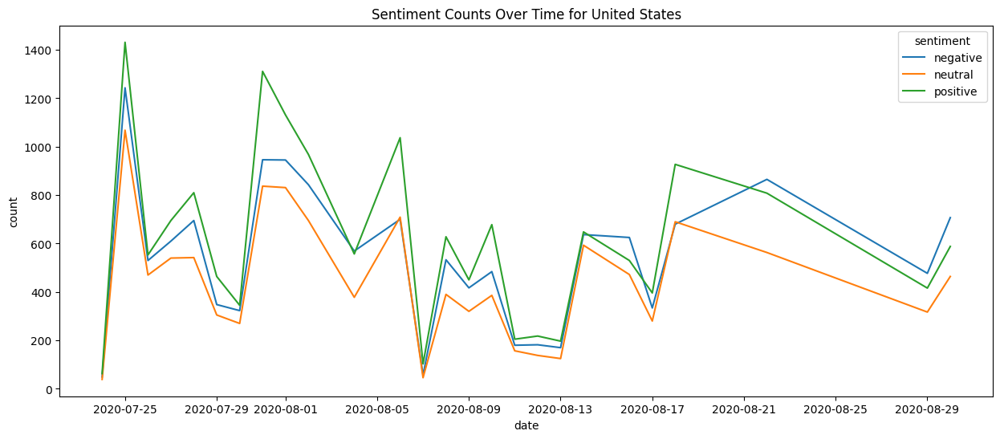

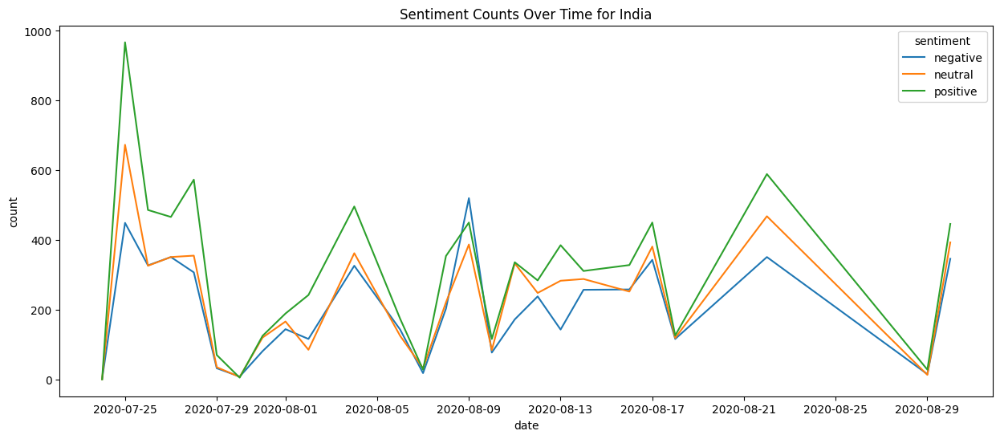

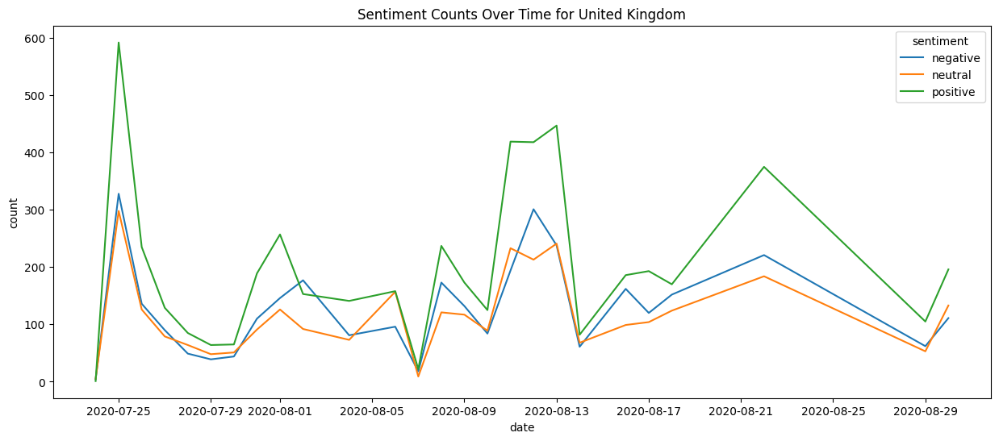

In [72]:
# For each country, create a separate plot
for country in most_active_countries:
    _ = plt.figure(figsize=(15, 6))
    _ = sns.lineplot(data=sentiment_melted[sentiment_melted['country'] == country], x="date", y="count", hue="sentiment")
    _ = plt.title(f'Sentiment Counts Over Time for {country}')
    _ = plt.show()

###  Use Wordcloud to Visualize Words Used in Sentiments

##### Define the `create_word_cloud()` function

In [73]:
# Function to create word cloud for a given sentiment
def create_word_cloud(sentiment):
    # Filtering the text based on the given sentiment
    text = ' '.join(df_twitter[df_twitter['sentiment'] == sentiment]['text'].values)
    
    # Creating the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    # Plotting the word cloud
    plt.figure(figsize=(15, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'Word Cloud for {sentiment.capitalize()} Sentiments')
    plt.show()

##### Creating word cloud for positive sentiment

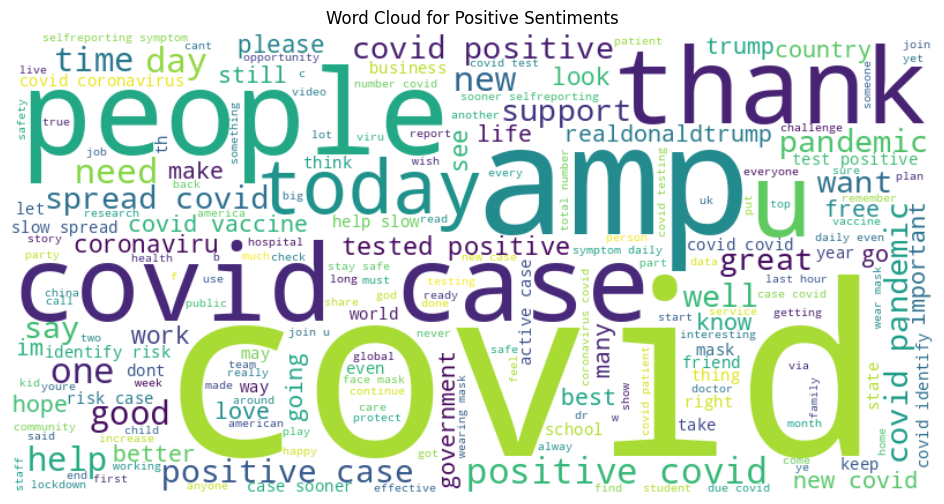

In [74]:
create_word_cloud('positive')


##### Creating word cloud for negative sentiment

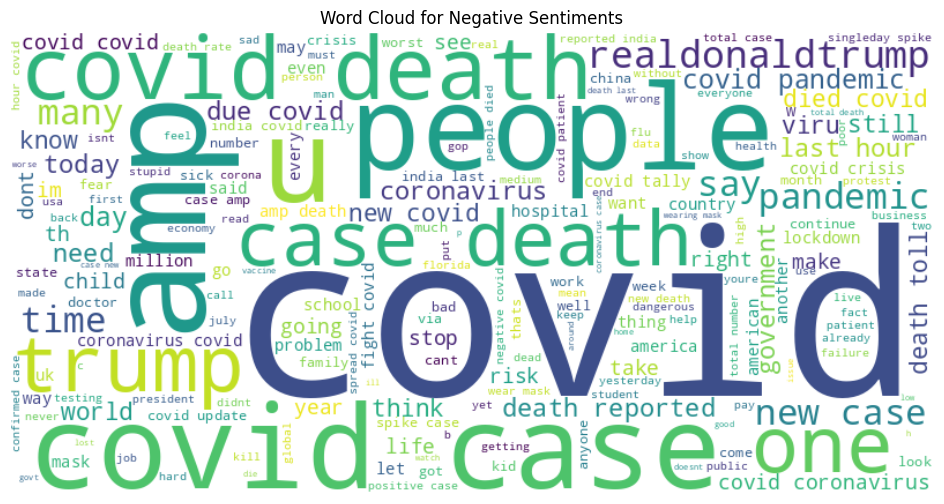

In [75]:
create_word_cloud('negative')


##### Creating word cloud for neutral sentiment

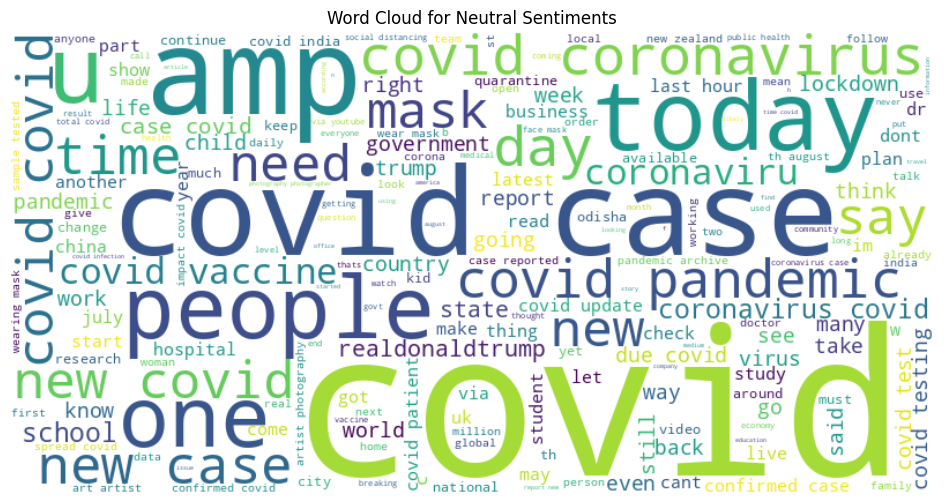

In [76]:
create_word_cloud('neutral')


###  Display the Sentiment on a Geographical Heatmap

##### Create mapping from positive, neutral and negative to an numerical value for visualization purpose

In [98]:
sentiment_mapping = {'positive': 1, 'neutral': 0, 'negative': -1}
df_twitter['sentiment_value'] = df_twitter['sentiment'].map(sentiment_mapping)

##### Visualize a geographical heatmap of all sentiment on the map

In [99]:
fig = px.density_mapbox(df_twitter, lat='lat', lon='long',
                        z='sentiment_value', radius=20,
                        center=dict(lat=df_twitter.lat.mean(), 
                                    lon=df_twitter.long.mean()), 
                        zoom=4,
                        mapbox_style="open-street-map", 
                        height=900)
fig.show()

## Part 5: Topic Modeling 

###  Train the LDA (Gensim) Model

##### Preprocess the text

In [100]:
df_twitter['text_tokens'] = df_twitter['text'].str.lower().str.split()


##### Create a dictionary

In [80]:
id2word = Dictionary(df_twitter['text_tokens'])


##### Filter extremes

In [81]:
id2word.filter_extremes(no_below=2, no_above=.99)


##### Create a corpus

In [82]:
corpus = [id2word.doc2bow(d) for d in df_twitter['text_tokens']]


##### Instantiate an LDA model 

In [83]:
base_model = LdaMulticore(corpus=corpus, num_topics=5, id2word=id2word, workers=12, 
passes=5)

### Part 6:   Evaluate the Model 

##### Print the topics

In [84]:
# Filtering for words 
words = [re.findall(r'"([^"]*)"',t[1]) for t in base_model.print_topics()]

# Create Topics
topics = [' '.join(t[0:10]) for t in words]

# Getting the topics
for id, t in enumerate(topics): 
    print(f"------ Topic {id} ------")
    print(t, end="\n\n")


------ Topic 0 ------
covid case new death positive total today reported coronavirus last

------ Topic 1 ------
covid amp case mask help people even spread new safe

------ Topic 2 ------
covid coronavirus vaccine day u people first india say case

------ Topic 3 ------
covid amp u pandemic people state country time death american

------ Topic 4 ------
covid mask amp people new health pandemic dont get im



##### Compute the perplexity and coherence score

In [85]:
# Compute Perplexity
# a measure of how good the model is. lower the better
base_perplexity = base_model.log_perplexity(corpus)
print('\nPerplexity: ', base_perplexity) 

# Compute Coherence Score
coherence_model = CoherenceModel(model=base_model, texts=df_twitter['text_tokens'], 
                                   dictionary=id2word, coherence='c_v')
coherence_lda_model_base = coherence_model.get_coherence()
print('\nCoherence Score: ', coherence_lda_model_base)


Perplexity:  -8.417719333286243

Coherence Score:  0.3236945886080604


###  Classify Twitter Tweets into Topics

##### Topic classification function

In [101]:
def classify_tweet(tweet):
    # Preprocess the tweet
    processed_tweet = tweet.lower().split()

    # Transform tweet into bag-of-words format
    tweet_bow = id2word.doc2bow(processed_tweet)

    # Get topic probabilities
    topic_probabilities = base_model.get_document_topics(tweet_bow)

    # Get the topic with the highest probability
    most_likely_topic = max(topic_probabilities, key=lambda x: x[1])

    return most_likely_topic[0]

##### Classify all tweets

In [87]:
df_twitter['topic'] = df_twitter['text'].apply(lambda x: classify_tweet(x)) 


##### Examine topic distribution

In [88]:
df_twitter.topic.value_counts()



topic
4    26684
3    23368
0    21422
2    20892
1    19607
Name: count, dtype: int64

##  Interpretation of Results

### Identify Relationships between Sentiment and Topic

##### Grouping and aggregating data by topic and sentiment

In [102]:
grouped = df_twitter.groupby(['topic', 'sentiment']).size().unstack(level='sentiment')
print(grouped)

sentiment  negative  neutral  positive
topic                                 
0              6933     7253      7236
1              5492     4704      9411
2              5730     6672      8490
3              8478     6985      7905
4              7139     7347     12198


##### Calculating proportions

In [90]:
percent_grouped = grouped.divide(grouped.sum(axis=1), axis=0)
print(percent_grouped)

sentiment  negative   neutral  positive
topic                                  
0          0.323639  0.338577  0.337784
1          0.280104  0.239914  0.479982
2          0.274268  0.319357  0.406376
3          0.362804  0.298913  0.338283
4          0.267539  0.275334  0.457128


##### Visualizing the results

<Axes: xlabel='topic'>

Text(0.5, 0, 'Topic')

Text(0, 0.5, 'Proportion of Tweets')

Text(0.5, 1.0, 'Proportion of Sentiments by Topic')

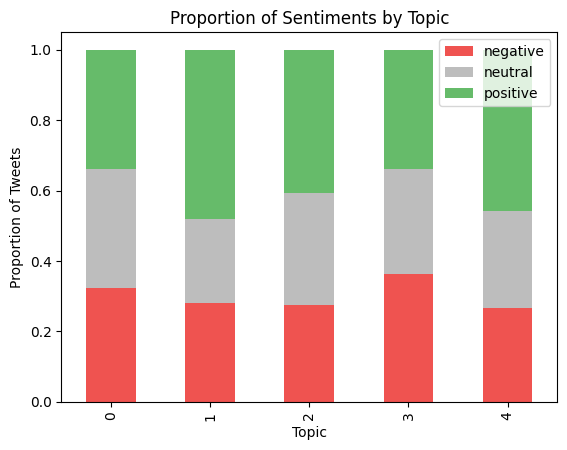

In [91]:
# Assign the colors based on your data's columns (assuming the columns of percent_grouped are 'positive', 'neutral', and 'negative')
palette = {'positive': '#66BB6A', 'neutral': '#BDBDBD', 'negative': '#EF5350'}
colors = [palette[col] for col in percent_grouped.columns]

percent_grouped.plot(kind='bar', stacked=True, color=colors)
plt.xlabel('Topic')
plt.ylabel('Proportion of Tweets')
plt.title('Proportion of Sentiments by Topic')
plt.legend(loc='upper right')
plt.show()

###  Interpret the Topic Modeling Results

##### Creating topic distance visualization

In [105]:
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(base_model, corpus, id2word)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.070266  0.009661       1        1  23.324339
3     -0.056116 -0.078658       2        1  20.433600
0      0.164499  0.002314       3        1  19.879000
2     -0.002067 -0.050375       4        1  18.618101
1     -0.036049  0.117057       5        1  17.744960, topic_info=                Term          Freq         Total Category  logprob  loglift
125             case  12689.000000  12689.000000  Default  30.0000  30.0000
163              new   7642.000000   7642.000000  Default  29.0000  29.0000
32             death   6119.000000   6119.000000  Default  28.0000  28.0000
120         positive   3427.000000   3427.000000  Default  27.0000  27.0000
131            total   2756.000000   2756.000000  Default  26.0000  26.0000
..               ...           ...           ...      ...      ...      ...
163              new   1021.305526   7642.372766   Topic5  -5.2568  -0.2836
32             death    791.720930   6119.214964   Topic5  -5.5114  -0.3159
16   realdonaldtrump    609.732095   2374.203767   Topic5  -5.7726   0.3697
175              one    657.447342   3550.330508   Topic5  -5.6972   0.0426
739             good    541.268805   1795.360850   Topic5  -5.8917   0.5300

[463 rows x 6 columns], token_table=       Topic      Freq           Term
term                                 
1480       5  0.969166    acknowledge
843        1  0.004185         active
843        2  0.005231         active
843        3  0.779483         active
843        4  0.062777         active
...      ...       ...            ...
22681      5  0.991775      yuvstrong
4768       2  0.940220         zombie
4768       3  0.030330         zombie
23843      5  0.989653  अनत_हगड_मफ_मग
26145      3  0.973452             पर

[1266 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 4, 1, 3, 2])

### Task 15: Compile your Findings into a Final Report with NBConvert

##### Execute the command within the provided notebook cell

In [108]:
!jupyter nbconvert --to html CovidSentimentAnalyzer.ipynb



[NbConvertApp] Converting notebook CovidSentimentAnalyzer.ipynb to html
[NbConvertApp] Writing 9302571 bytes to CovidSentimentAnalyzer.html
